In [4]:
!nvidia-smi

Thu Dec  5 22:09:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3060        Off | 00000000:02:00.0 Off |                  N/A |
|  0%   52C    P2              39W / 170W |  10508MiB / 12288MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [5]:
!nvidia-smi | grep 'python' | awk '{ print $3 }' | xargs -n1 kill -9 1617291

kill: failed to parse argument: 'N/A'


In [2]:
import warnings

warnings.filterwarnings('ignore')
import tensorflow as tf
from tensorflow import keras
import os
import pandas as pd
from xml.etree import ElementTree
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from skimage import measure
import xml.etree.ElementTree as ET
import cairosvg
import plotly.express as px
from PIL import Image
import shutil as shitul
from lxml import etree
import re
import io
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TensorBoard

2025-01-08 15:11:20.178175: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1736323880.196613 3008137 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1736323880.202256 3008137 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-08 15:11:20.224425: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
def parse_xml_to_mask(xml_path, image_shape):
    mask = np.zeros(image_shape[:2], dtype=np.uint8)
    tree = ElementTree.parse(xml_path)
    root = tree.getroot()
    
    for obj in root.findall('object'):
        polygon = obj.find('polygon')
        points = []
        
        i = 1
        while True:
            x_tag = f'x{i}'
            y_tag = f'y{i}'
            x = polygon.find(x_tag)
            y = polygon.find(y_tag)
            
            if x is None or y is None:
                break

            try:
                x = int(float(x.text))
                y = int(float(y.text))
                points.append((x, y))
            except Exception as e:
                print(f"Error parsing point {x_tag}, {y_tag} in {xml_path}: {e}")
            
            i += 1

        if points:
            points = np.array(points, dtype=np.int32)
            cv2.fillPoly(mask, [points], color=1)
        else:
            print(f"No points found for an object in {xml_path}")

    return mask

def load_images_and_masks(folder_path,image_size=(384, 384)): # deprecated
    images = []
    masks = []
    
    jpg_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.jpg')])

    for jpg_file in jpg_files:
        img_path = os.path.join(folder_path, jpg_file)
        img = cv2.imread(img_path)
        #img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        if img is None:
            print(f"Warning: Image file {jpg_file} could not be loaded.")
            continue
        
        xml_file = jpg_file.replace('.jpg', '.xml')
        xml_path = os.path.join(folder_path, xml_file)
        
        if os.path.exists(xml_path):
            mask = parse_xml_to_mask(xml_path, img.shape) 
            
            img_resized = cv2.resize(img, image_size)
            mask_resized = cv2.resize(mask, image_size, interpolation=cv2.INTER_NEAREST)
            
            img_resized = img_resized / 255.0
            mask_resized = (mask_resized > 0.5).astype(np.uint8) 
            
            images.append(img_resized)
            masks.append(mask_resized[..., np.newaxis]) 
        else:
            print(f"Warning: No XML file found for {jpg_file}")
    
    return np.array(images), np.array(masks)


In [4]:
def encoder_block(inputs, num_filters):
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(inputs)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
    return x

def decoder_block(inputs, skip_features, num_filters):
    x = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding='same')(inputs)
    if skip_features.shape[1] != x.shape[1] or skip_features.shape[2] != x.shape[2]:
        skip_features = tf.keras.layers.UpSampling2D(size=(2, 2))(skip_features)
    x = tf.keras.layers.Concatenate()([x, skip_features])
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(x)
    x = tf.keras.layers.Activation('relu')(x)
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(x)
    x = tf.keras.layers.Activation('relu')(x)
    return x

def unet_model(input_shape=(448, 448, 3), num_classes=1):
    inputs = tf.keras.layers.Input(input_shape)
    s1 = encoder_block(inputs, 32)
    s2 = encoder_block(s1, 64)
    s3 = encoder_block(s2, 128)
    s4 = encoder_block(s3, 256)
    #s5 = encoder_block(s4, 1024)
    
    b1 = tf.keras.layers.Conv2D(512, 3, padding='same')(s4)
    b1 = tf.keras.layers.Activation('relu')(b1)
    
    #d0 = decoder_block(b1, s5, 1024)
    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)
    
    outputs = tf.keras.layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(d4)
    model = tf.keras.models.Model(inputs, outputs, name="U-Net")
    return model

model = unet_model()
model.summary()


W0000 00:00:1736323890.537358 3008137 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 448, 448,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 448, 448,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 448, 448,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 448, 448,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 448, 448,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 224, 224,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 224, 224,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 224, 224,  │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 224, 224,  │     36,928 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 224, 224,  │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 112, 112,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 112, 112,  │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 112, 112,  │          0 │ conv2d_4[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 112, 112,  │    147,584 │ activation_4[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 112, 112,  │          0 │ conv2d_5[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 56, 56,    │          0 │ activation_5[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 56, 56,    │    295,168 │ max_pooling2d_2[

 Total params: 5,400,289 (20.60 MB)

 Trainable params: 5,400,289 (20.60 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
def residual_block(inputs, num_filters):
    res = inputs 
    
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    
    x = tf.keras.layers.Conv2D(num_filters, 3, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    
    if res.shape[-1] != x.shape[-1]:
        res = tf.keras.layers.Conv2D(num_filters, (1, 1), padding='same')(res)
    
    x = tf.keras.layers.Add()([x, res])
    x = tf.keras.layers.ReLU()(x)
    
    return x

def encoder_block(inputs, num_filters):
    x = residual_block(inputs, num_filters)
    x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
    return x

def decoder_block(inputs, skip_features, num_filters):
    x = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding='same')(inputs)
    if skip_features.shape[1] != x.shape[1] or skip_features.shape[2] != x.shape[2]:
        skip_features = tf.keras.layers.UpSampling2D(size=(2, 2))(skip_features)
    
    x = tf.keras.layers.Concatenate()([x, skip_features])
    x = residual_block(x, num_filters)  
    return x

def resunet_model(input_shape=(384, 384, 3), num_classes=1):
    inputs = tf.keras.layers.Input(input_shape)
    
    s1 = encoder_block(inputs, 32)
    s2 = encoder_block(s1, 64)
    s3 = encoder_block(s2, 128)
    s4 = encoder_block(s3, 256)
    
    b1 = residual_block(s4, 512)
    
    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)
    
    outputs = tf.keras.layers.Conv2D(num_classes, 1, padding='same', activation='sigmoid')(d4)
    
    model = tf.keras.models.Model(inputs, outputs, name="ResU-Net")
    
    return model

model = resunet_model()
model.summary()

Model: "ResU-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 384, 384,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 384, 384,  │        128 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 384, 384,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 384, 384,  │      9,248 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 384, 384,  │        128 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 384, 384,  │        128 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 384, 384,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ conv2d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 384, 384,  │          0 │ add[0][0]         │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 192, 192,  │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 192, 192,  │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        256 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 192, 192,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 192, 192,  │     36,928 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │        256 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 192, 192,  │      2,112 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 192, 192,  │          0 │ batch_normalizat

 Total params: 8,121,601 (30.98 MB)

 Trainable params: 8,115,713 (30.96 MB)

 Non-trainable params: 5,888 (23.00 KB)

In [6]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

nb_filter = [32,64,128,256,512]
# Build U-Net++ model
inputs = tf.keras.layers.Input((384, 384, 3))
s = Lambda(lambda x: x / 255) (inputs)


c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.5) (c1)
c1 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
c1 = Dropout(0.5) (c1)
p1 = MaxPooling2D((2, 2), strides=(2, 2)) (c1)

c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.5) (c2)
c2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
c2 = Dropout(0.5) (c2)
p2 = MaxPooling2D((2, 2), strides=(2, 2)) (c2)

up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(c2)
conv1_2 = concatenate([up1_2, c1], name='merge12', axis=3)
c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_2)
c3 = Dropout(0.5) (c3)
c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
c3 = Dropout(0.5) (c3)

conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
conv3_1 = Dropout(0.5) (conv3_1)
conv3_1 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_1)
conv3_1 = Dropout(0.5) (conv3_1)
pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
conv2_2 = concatenate([up2_2, c2], name='merge22', axis=3) #x10
conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
conv2_2 = Dropout(0.5) (conv2_2)
conv2_2 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_2)
conv2_2 = Dropout(0.5) (conv2_2)

up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
conv1_3 = concatenate([up1_3, c1, c3], name='merge13', axis=3)
conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
conv1_3 = Dropout(0.5) (conv1_3)
conv1_3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_3)
conv1_3 = Dropout(0.5) (conv1_3)

conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool3)
conv4_1 = Dropout(0.5) (conv4_1)
conv4_1 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_1)
conv4_1 = Dropout(0.5) (conv4_1)
pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=3) #x20
conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
conv3_2 = Dropout(0.5) (conv3_2)
conv3_2 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_2)
conv3_2 = Dropout(0.5) (conv3_2)

up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
conv2_3 = concatenate([up2_3, c2, conv2_2], name='merge23', axis=3)
conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
conv2_3 = Dropout(0.5) (conv2_3)
conv2_3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_3)
conv2_3 = Dropout(0.5) (conv2_3)

up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
conv1_4 = concatenate([up1_4, c1, c3, conv1_3], name='merge14', axis=3)
conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
conv1_4 = Dropout(0.5) (conv1_4)
conv1_4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_4)
conv1_4 = Dropout(0.5) (conv1_4)

conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (pool4)
conv5_1 = Dropout(0.5) (conv5_1)
conv5_1 = Conv2D(512, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv5_1)
conv5_1 = Dropout(0.5) (conv5_1)

up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=3) #x30
conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
conv4_2 = Dropout(0.5) (conv4_2)
conv4_2 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv4_2)
conv4_2 = Dropout(0.5) (conv4_2)

up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=3)
conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
conv3_3 = Dropout(0.5) (conv3_3)
conv3_3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv3_3)
conv3_3 = Dropout(0.5) (conv3_3)

up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
conv2_4 = concatenate([up2_4, c2, conv2_2, conv2_3], name='merge24', axis=3)
conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
conv2_4 = Dropout(0.5) (conv2_4)
conv2_4 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv2_4)
conv2_4 = Dropout(0.5) (conv2_4)

up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
conv1_5 = concatenate([up1_5, c1, c3, conv1_3, conv1_4], name='merge15', axis=3)
conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
conv1_5 = Dropout(0.5) (conv1_5)
conv1_5 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (conv1_5)
conv1_5 = Dropout(0.5) (conv1_5)

nestnet_output_4 = Conv2D(1, (1, 1), activation='sigmoid', kernel_initializer = 'he_normal',  name='output_4', padding='same')(conv1_5)

model = Model([inputs], [nestnet_output_4])
# model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR), loss=bce_dice_loss)

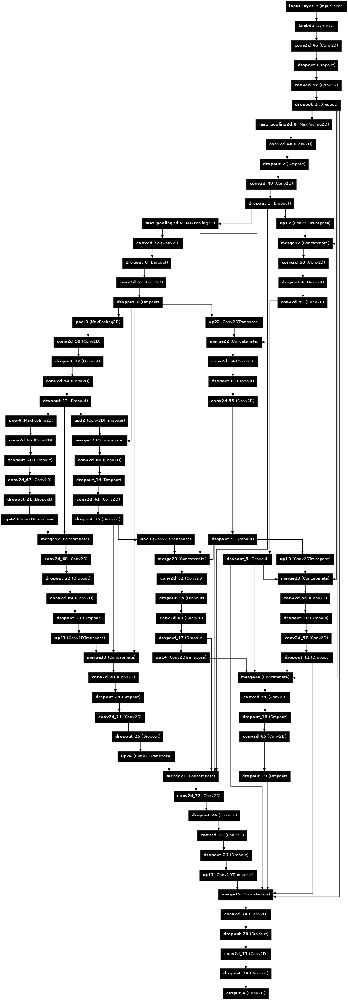

In [8]:
tf.keras.utils.plot_model(
    model,
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=46,
    layer_range=None
)

In [7]:
train_images, train_masks = load_images_and_masks('Panel-extraction-2/augin_train')
valid_images, valid_masks = load_images_and_masks('Panel-extraction-2/valid')

#train_dataset = create_tf_dataset('Panel-extraction-2/train', image_size=(384, 384), batch_size=8)
#valid_dataset = create_tf_dataset('Panel-extraction-2/valid', image_size=(384, 384), batch_size=8)

#model = resunet_model()

checkpoint = ModelCheckpoint(
    'models/best_model_resunet_aug_2.keras', 
    monitor='val_accuracy',  
    mode='max', 
    save_best_only=True, 
    verbose=1  
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=1000,
    min_lr=0.0005)


########################
decay_steps = 18000
initial_learning_rate = 0.001
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=initial_learning_rate,
    decay_steps=decay_steps,
    alpha=0.0  # Minimum learning rate as a fraction of initial_learning_rate
)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

# Learning Rate Tracker
class LearningRateTracker(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        current_lr = self.model.optimizer.learning_rate(epoch).numpy()
        print(f"Epoch {epoch + 1}: Learning rate = {current_lr}")

# Model Compilation
model.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[tf.keras.metrics.BinaryAccuracy()]
)

checkpoint = ModelCheckpoint(
    filepath='models/best_model_resunet_aug_2.keras',
    monitor='val_binary_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=0.0001,
    verbose=1
)

In [8]:
history = model.fit(
    train_images, train_masks,
    validation_data=(valid_images, valid_masks),
    epochs=150,
    batch_size=7,
    callbacks=[checkpoint, reduce_lr, LearningRateTracker()],
    verbose=1
)

Epoch 1/150
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - binary_accuracy: 0.8396 - loss: 0.4554 
Epoch 1: val_binary_accuracy improved from -inf to 0.90338, saving model to models/best_model_resunet_aug_2.keras


TypeError: 'tensorflow.python.framework.ops.EagerTensor' object is not callable

In [ ]:
plt.figure(figsize=(10, 6))
steps = np.arange(0, decay_steps + 1)
cosine_lr = lr_schedule(steps)
plt.plot(steps, cosine_lr, label='Cosine Decay (ideal)', color='b', linestyle='--')
plt.plot(lr_tracker.learning_rates, label='Actual Learning Rate', color='r')
plt.title("Learning Rate vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Learning Rate")
plt.legend()
plt.grid(True)
plt.show()

Aug train acc 384x384: 98.95

In [8]:
history_data = {
    'Epoch': range(1, len(history.history['loss']) + 1),
    'Training Loss': history.history['loss'],
    'Validation Loss': history.history['val_loss'],
    'Training Accuracy': history.history['accuracy'],
    'Validation Accuracy': history.history['val_accuracy']
}
df_history = pd.DataFrame(history_data)

df_melted = df_history.melt(id_vars='Epoch', 
                            value_vars=['Training Loss', 'Validation Loss', 'Training Accuracy', 'Validation Accuracy'], 
                            var_name='Metric', 
                            value_name='Value')

df_loss = df_melted[df_melted['Metric'].isin(['Training Loss', 'Validation Loss'])]
df_accuracy = df_melted[df_melted['Metric'].isin(['Training Accuracy', 'Validation Accuracy'])]

fig_loss = px.line(df_loss, x='Epoch', y='Value', color='Metric', 
                   title='Training and Validation Loss', 
                   labels={'Value': 'Loss', 'Metric': 'Legend'})
fig_loss.show()

fig_accuracy = px.line(df_accuracy, x='Epoch', y='Value', color='Metric', 
                       title='Training and Validation Accuracy', 
                       labels={'Value': 'Accuracy', 'Metric': 'Legend'})
fig_accuracy.show()


In [8]:
def plot_predictions_no_post_processing(image, true_mask, pred_mask, threshold=0.5):
    pred_binary = (pred_mask > threshold).astype(np.uint8)
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title("Input Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(true_mask.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Raw Predicted Mask")
    plt.imshow(pred_binary.squeeze(), cmap='gray')
    plt.axis('off')

    plt.show()
    
def plot_predictions_post_processing(image, true_mask, pred_mask, processed_mask, threshold=0.5):
    pred_binary = (pred_mask > threshold).astype(np.uint8)
    plt.figure(figsize=(16, 4))

    plt.subplot(1, 4, 1)
    plt.title("Input Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(true_mask.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title("Raw Predicted Mask")
    plt.imshow(pred_binary.squeeze(), cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Processed Predicted Mask")
    plt.imshow(processed_mask.squeeze(), cmap='gray')
    plt.axis('off')
    
    plt.show()

In [9]:
def test_remove_noise(mask, noise_threshold = 100):
    # Label connected components in binary mask
    labeled_mask = measure.label(mask, connectivity = 2)  # connectivity = 2 considers diagonal connections
    
    # Remove small components if they are below the noise_threshold
    for region in measure.regionprops(labeled_mask):
        if region.area < noise_threshold:
            for coord in region.coords:
                mask[coord[0], coord[1]] = 0 # 1 => foreground
    return mask 
                
def post_process_mask(mask, threshold=0.5, noise_threshold = 5):
    binary_mask = (mask > threshold).astype(np.uint8)
    # binary_mask = test_remove_noise(binary_mask)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)
    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        if area < noise_threshold:
            binary_mask[labels == i] = 0

    # gaussian_ksize = (7, 7) 
    erosion_kernel_1 = np.ones((5, 5), np.uint8)
    dilation_kernel_1 = np.ones((5, 5), np.uint8)
    erosion_kernel_2 = np.ones((3, 3), np.uint8)
    dilation_kernel_2 = np.ones((3, 3), np.uint8)

    #blurred_mask = cv2.GaussianBlur(binary_mask, gaussian_ksize, 0)
    eroded_mask = cv2.erode(binary_mask, erosion_kernel_1, iterations=1)
    dilated_mask = cv2.dilate(eroded_mask, dilation_kernel_1, iterations=1)
    eroded_mask_2 = cv2.erode(dilated_mask, erosion_kernel_2, iterations=1)
    processed_mask = cv2.dilate(eroded_mask_2, dilation_kernel_2, iterations=1)
    
    
    return processed_mask

In [10]:
def calculate_metrics(pred_mask, true_mask, threshold=0.5):
    
    pred_binary = (pred_mask > threshold).astype(np.uint8)
    true_binary = (true_mask > 0.5).astype(np.uint8)
    
    correct_pixels = np.sum(pred_binary == true_binary)
    total_pixels = true_mask.size
    pixel_accuracy = correct_pixels / total_pixels
    
    true_positive = np.sum((pred_binary == 1) & (true_binary == 1))
    true_negative = np.sum((pred_binary == 0) & (true_binary == 0))
    false_positive = np.sum((pred_binary == 1) & (true_binary == 0))
    false_negative = np.sum((pred_binary == 0) & (true_binary == 1))
    
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    specificity = true_negative / (true_negative + false_positive) if (true_negative + false_positive) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    return {
        "pixel_accuracy": pixel_accuracy,
        "precision": precision,
        "recall": recall,
        "specificity": specificity,
        "f1_score": f1_score
    }


In [3]:
model_250= tf.keras.models.load_model('models/best_model_3.keras')

W0000 00:00:1735044352.171504 3458994 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [5]:
model_250.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 384, 384,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_17       │ (None, 384, 384,  │          0 │ conv2d_18[0][0]   │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 384, 384,  │     36,928 │ activation_17[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 384, 384,  │          0 │ conv2d_19[0][0]   │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 192, 192,  │          0 │ activation_18[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 192, 192,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 192, 192,  │          0 │ conv2d_20[0][0]   │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 192, 192,  │    147,584 │ activation_19[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 192, 192,  │          0 │ conv2d_21[0][0]   │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 96, 96,    │          0 │ activation_20[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 96, 96,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 96, 96,    │          0 │ conv2d_22[0][0]   │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 96, 96,    │    590,080 │ activation_21[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_22       │ (None, 96, 96,    │          0 │ conv2d_23[0][0]   │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 48, 48,    │          0 │ activation_22[0]… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 48, 48,    │  1,180,160 │ max_pooling2d_6[

 Total params: 64,780,613 (247.12 MB)

 Trainable params: 21,593,537 (82.37 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 43,187,076 (164.75 MB)

In [ ]:
# test_images, test_masks = load_images_and_masks('Panel-extraction-2/test')

# for i in range(len(test_images)): 
#     img = test_images[i]
#     true_mask = test_masks[i]
    
    
#     true_mask_path = os.path.join(true_mask_folder, f"true_mask_{i+1}.png")
#     pred_mask_path = os.path.join(pred_mask_folder, f"pred_mask_raw_{i+1}.png")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Sample 1 - Pixel Accuracy: 0.9941 - Precision: 0.9968 - Recall: 0.9967 - F1 Score: 0.9967


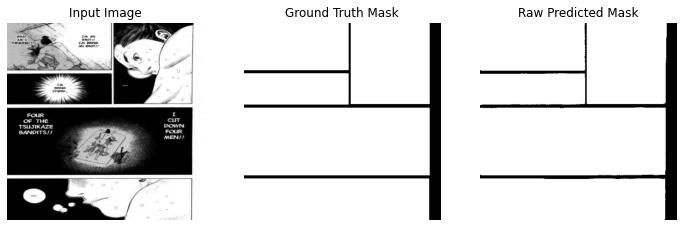

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Sample 2 - Pixel Accuracy: 0.9958 - Precision: 0.9972 - Recall: 0.9983 - F1 Score: 0.9977


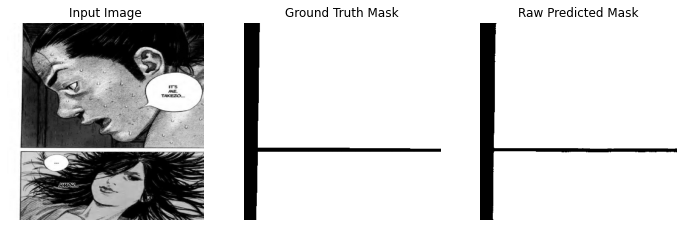

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 3 - Pixel Accuracy: 0.9984 - Precision: 0.9986 - Recall: 0.9997 - F1 Score: 0.9991


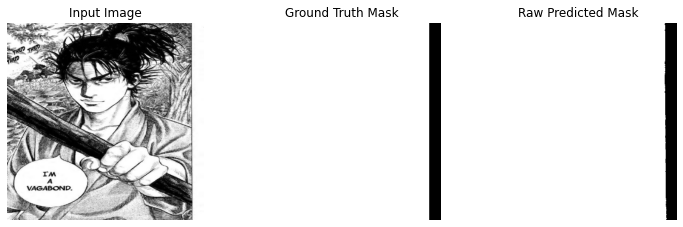

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 4 - Pixel Accuracy: 0.9853 - Precision: 0.9852 - Recall: 0.9981 - F1 Score: 0.9916


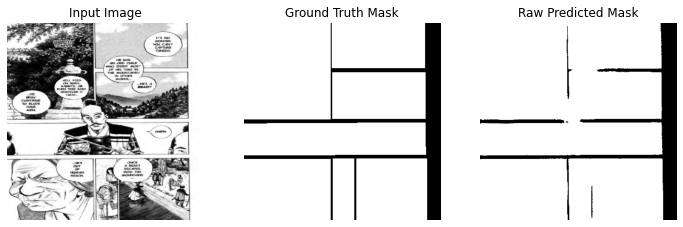

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 5 - Pixel Accuracy: 0.9881 - Precision: 0.9903 - Recall: 0.9962 - F1 Score: 0.9932


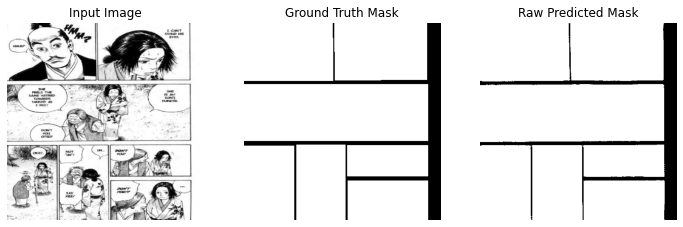

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 6 - Pixel Accuracy: 0.9949 - Precision: 0.9968 - Recall: 0.9976 - F1 Score: 0.9972


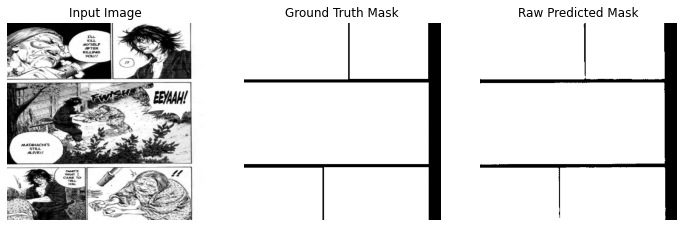

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Sample 7 - Pixel Accuracy: 0.9918 - Precision: 0.9933 - Recall: 0.9976 - F1 Score: 0.9954


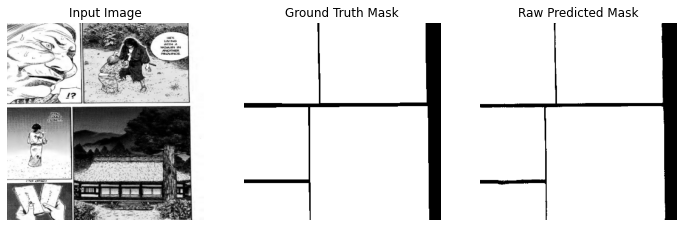

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 8 - Pixel Accuracy: 0.9871 - Precision: 0.9887 - Recall: 0.9965 - F1 Score: 0.9926


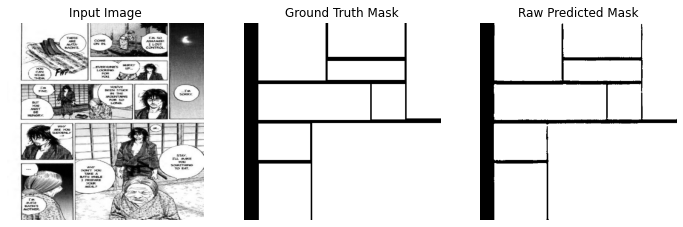

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 9 - Pixel Accuracy: 0.9916 - Precision: 0.9911 - Recall: 0.9996 - F1 Score: 0.9953


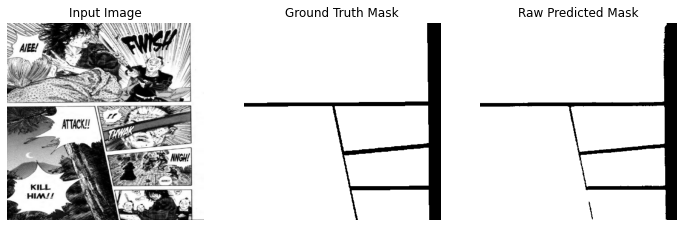

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 10 - Pixel Accuracy: 0.9892 - Precision: 0.9891 - Recall: 0.9986 - F1 Score: 0.9938


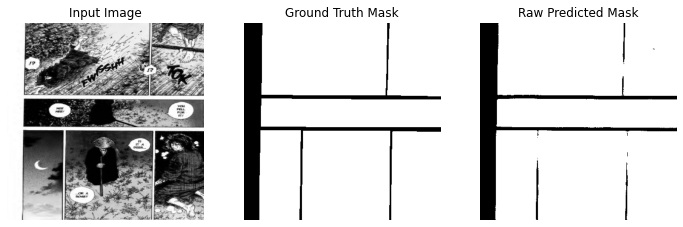

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 11 - Pixel Accuracy: 0.9903 - Precision: 0.9950 - Recall: 0.9942 - F1 Score: 0.9946


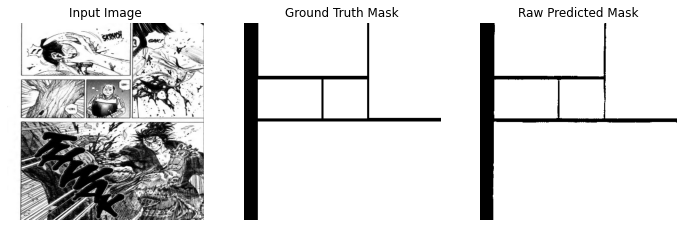

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 12 - Pixel Accuracy: 0.9895 - Precision: 0.9912 - Recall: 0.9970 - F1 Score: 0.9941


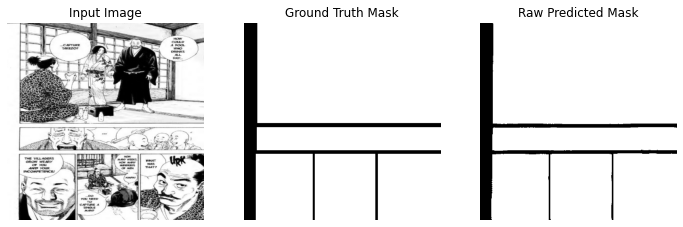

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 13 - Pixel Accuracy: 0.9797 - Precision: 0.9838 - Recall: 0.9928 - F1 Score: 0.9883


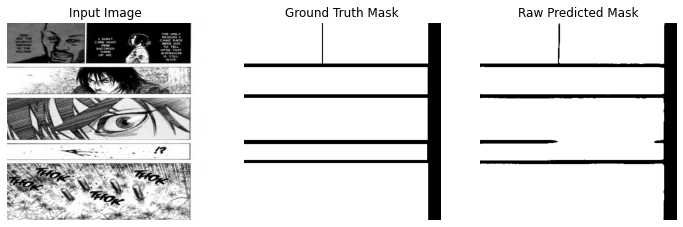

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 14 - Pixel Accuracy: 0.9955 - Precision: 0.9952 - Recall: 1.0000 - F1 Score: 0.9976


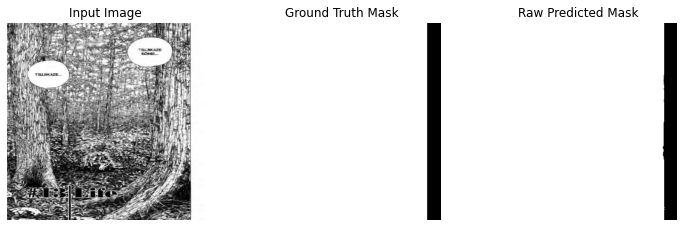

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 15 - Pixel Accuracy: 0.9914 - Precision: 0.9953 - Recall: 0.9949 - F1 Score: 0.9951


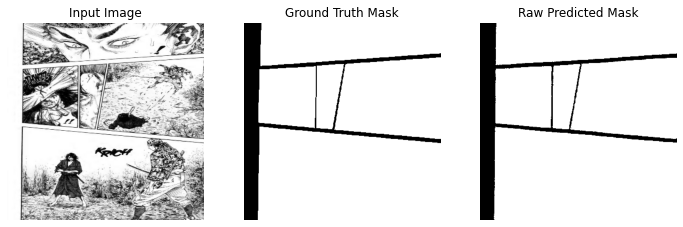

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 16 - Pixel Accuracy: 0.9940 - Precision: 0.9971 - Recall: 0.9961 - F1 Score: 0.9966


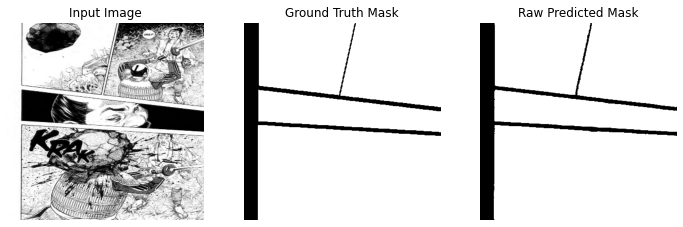

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 17 - Pixel Accuracy: 0.9951 - Precision: 0.9981 - Recall: 0.9965 - F1 Score: 0.9973


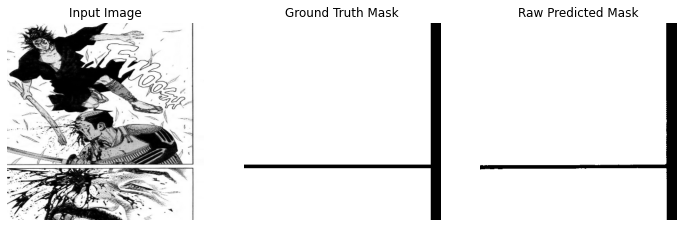

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 18 - Pixel Accuracy: 0.9900 - Precision: 0.9905 - Recall: 0.9983 - F1 Score: 0.9944


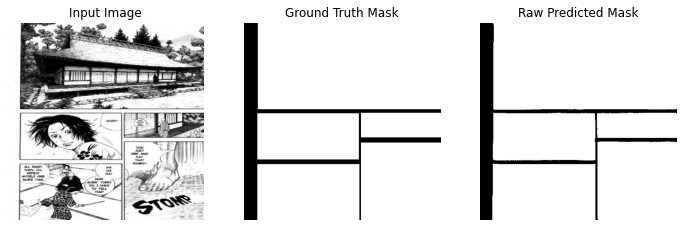

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 19 - Pixel Accuracy: 0.9900 - Precision: 0.9958 - Recall: 0.9931 - F1 Score: 0.9944


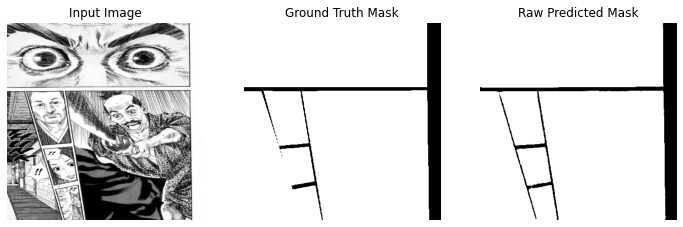

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 20 - Pixel Accuracy: 0.9881 - Precision: 0.9918 - Recall: 0.9947 - F1 Score: 0.9932


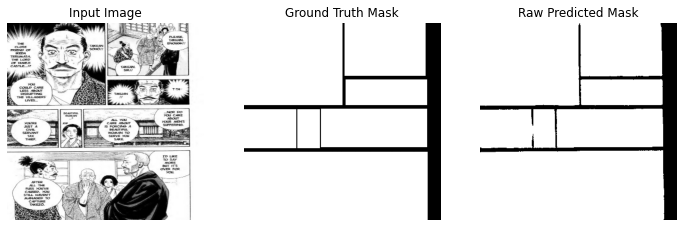

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 21 - Pixel Accuracy: 0.9945 - Precision: 0.9964 - Recall: 0.9975 - F1 Score: 0.9969


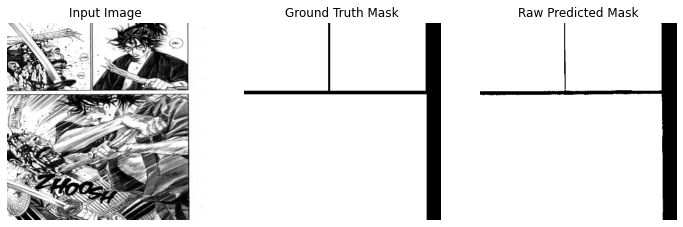

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 22 - Pixel Accuracy: 0.9788 - Precision: 0.9967 - Recall: 0.9799 - F1 Score: 0.9882


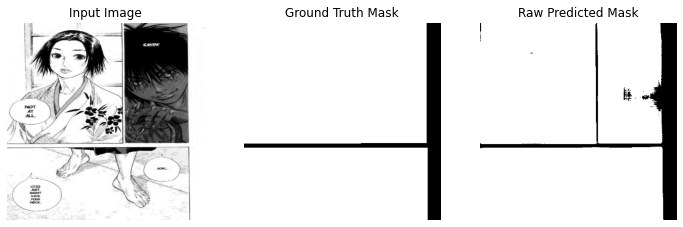

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 23 - Pixel Accuracy: 0.9981 - Precision: 0.9982 - Recall: 0.9997 - F1 Score: 0.9990


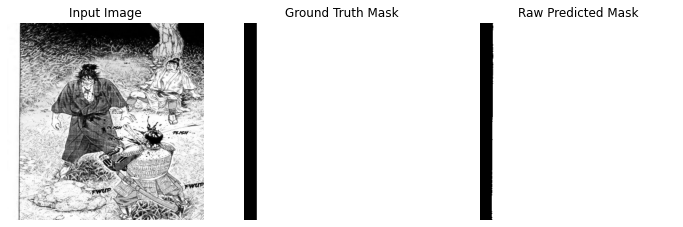

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 24 - Pixel Accuracy: 0.9903 - Precision: 0.9940 - Recall: 0.9951 - F1 Score: 0.9946


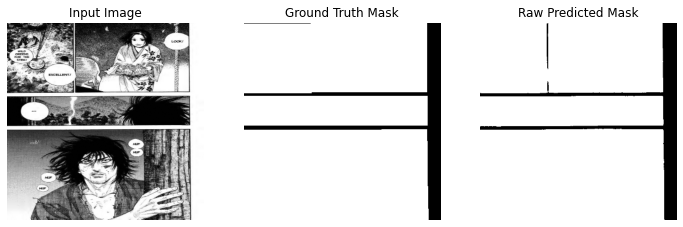

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 25 - Pixel Accuracy: 0.9835 - Precision: 0.9953 - Recall: 0.9861 - F1 Score: 0.9907


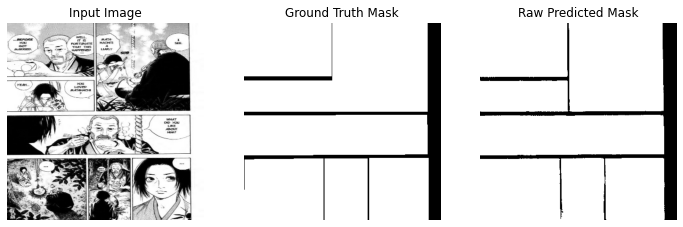

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 26 - Pixel Accuracy: 0.9910 - Precision: 0.9965 - Recall: 0.9934 - F1 Score: 0.9950


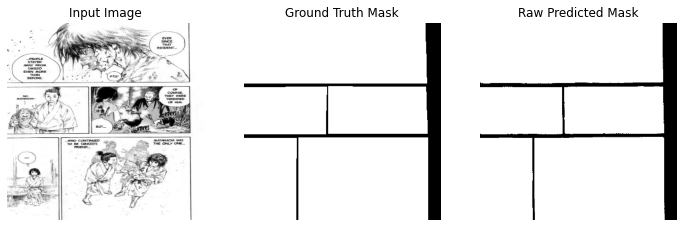

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 27 - Pixel Accuracy: 0.9845 - Precision: 0.9898 - Recall: 0.9925 - F1 Score: 0.9911


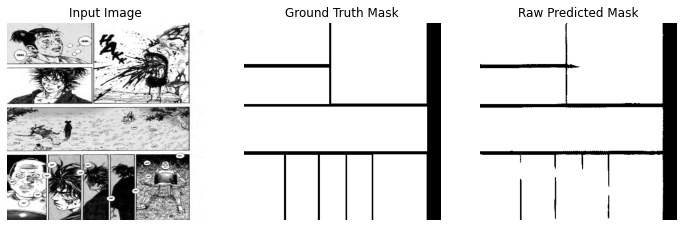

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 28 - Pixel Accuracy: 0.9915 - Precision: 0.9927 - Recall: 0.9979 - F1 Score: 0.9953


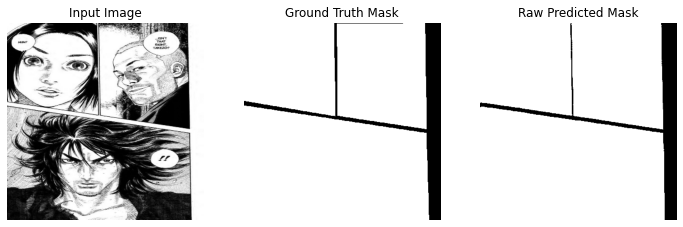

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 29 - Pixel Accuracy: 0.9908 - Precision: 0.9940 - Recall: 0.9957 - F1 Score: 0.9949


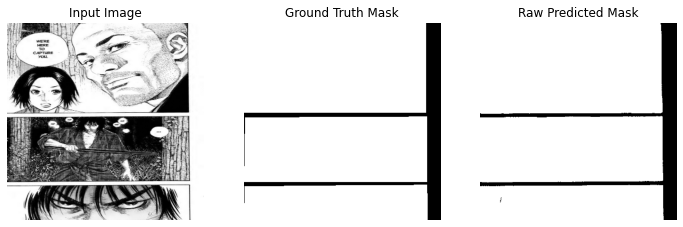

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 30 - Pixel Accuracy: 0.9977 - Precision: 0.9978 - Recall: 0.9996 - F1 Score: 0.9987


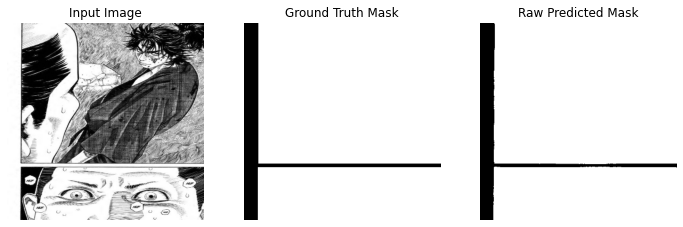

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 31 - Pixel Accuracy: 0.9928 - Precision: 0.9938 - Recall: 0.9983 - F1 Score: 0.9960


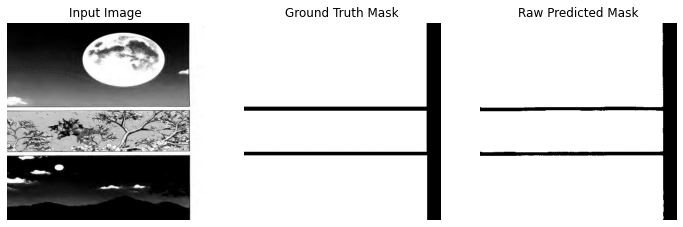

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 32 - Pixel Accuracy: 0.9861 - Precision: 0.9922 - Recall: 0.9920 - F1 Score: 0.9921


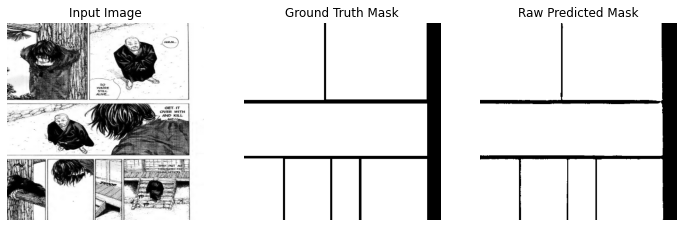

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 33 - Pixel Accuracy: 0.9645 - Precision: 0.9650 - Recall: 0.9956 - F1 Score: 0.9801


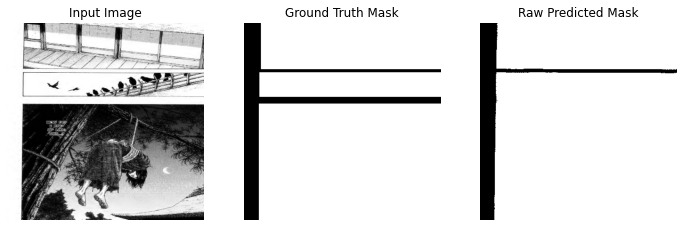

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 34 - Pixel Accuracy: 0.9750 - Precision: 0.9935 - Recall: 0.9791 - F1 Score: 0.9862


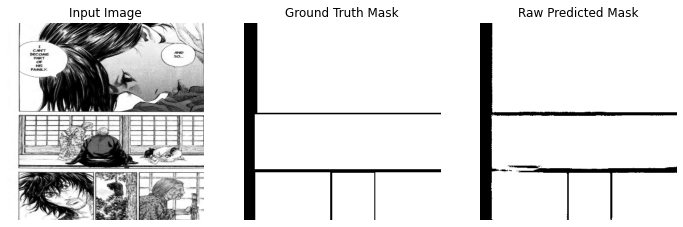

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 35 - Pixel Accuracy: 0.9879 - Precision: 0.9913 - Recall: 0.9948 - F1 Score: 0.9930


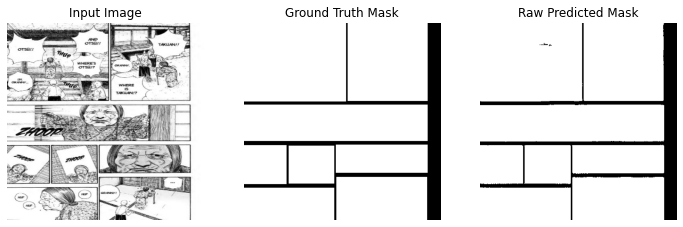

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 36 - Pixel Accuracy: 0.9914 - Precision: 0.9958 - Recall: 0.9945 - F1 Score: 0.9951


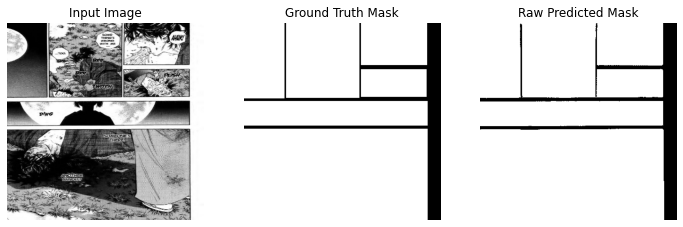

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 37 - Pixel Accuracy: 0.9922 - Precision: 0.9944 - Recall: 0.9967 - F1 Score: 0.9956


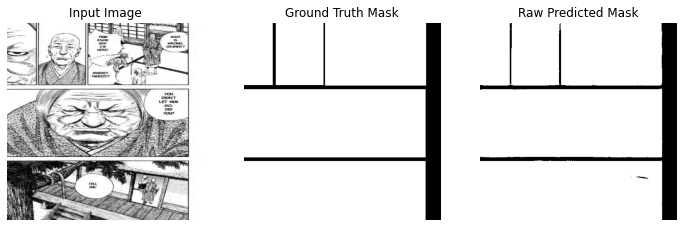

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 38 - Pixel Accuracy: 0.9949 - Precision: 0.9985 - Recall: 0.9958 - F1 Score: 0.9971


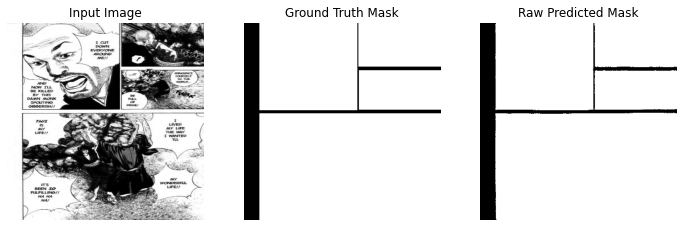

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 39 - Pixel Accuracy: 0.9888 - Precision: 0.9942 - Recall: 0.9931 - F1 Score: 0.9937


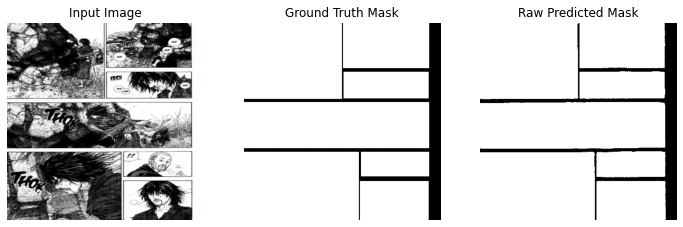

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 40 - Pixel Accuracy: 0.9919 - Precision: 0.9927 - Recall: 0.9987 - F1 Score: 0.9957


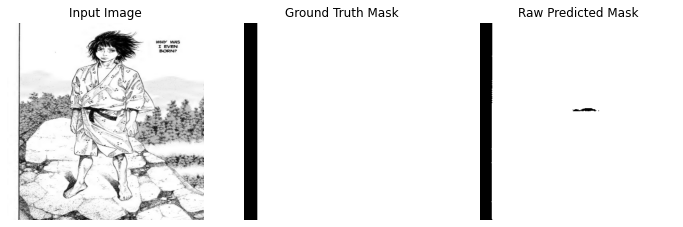

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 41 - Pixel Accuracy: 0.9987 - Precision: 0.9987 - Recall: 1.0000 - F1 Score: 0.9994


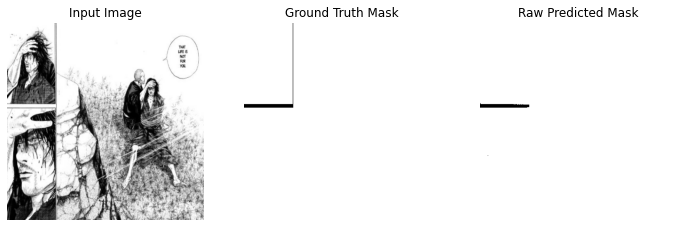

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 42 - Pixel Accuracy: 0.9935 - Precision: 0.9935 - Recall: 0.9993 - F1 Score: 0.9964


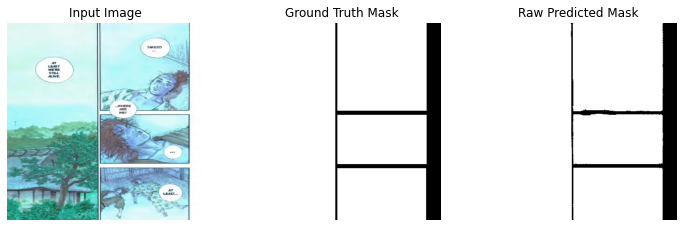

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 43 - Pixel Accuracy: 0.9986 - Precision: 0.9986 - Recall: 0.9999 - F1 Score: 0.9993


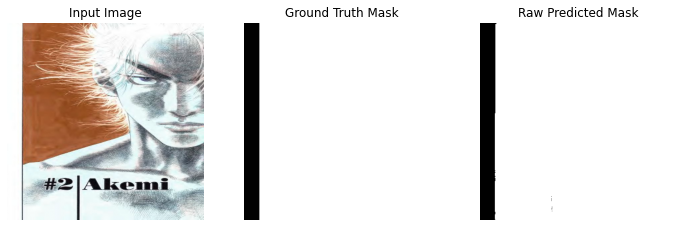

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 44 - Pixel Accuracy: 0.9718 - Precision: 0.9980 - Recall: 0.9710 - F1 Score: 0.9843


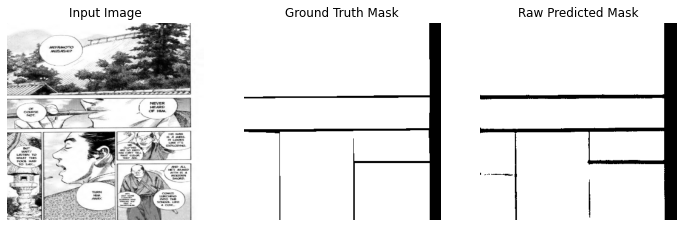

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 45 - Pixel Accuracy: 0.9854 - Precision: 0.9933 - Recall: 0.9907 - F1 Score: 0.9920


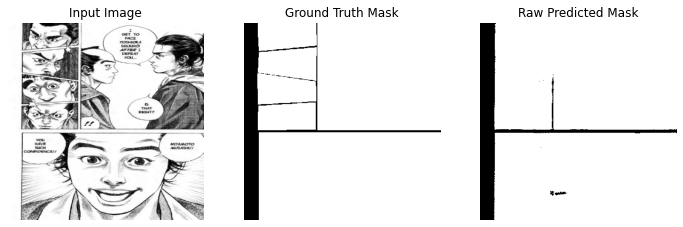

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 46 - Pixel Accuracy: 0.9937 - Precision: 0.9931 - Recall: 1.0000 - F1 Score: 0.9965


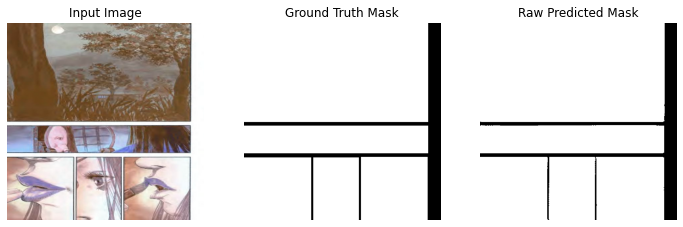

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 47 - Pixel Accuracy: 0.9792 - Precision: 0.9988 - Recall: 0.9784 - F1 Score: 0.9885


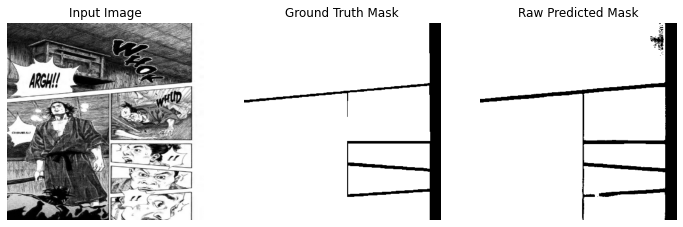

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 48 - Pixel Accuracy: 0.9823 - Precision: 0.9940 - Recall: 0.9879 - F1 Score: 0.9909


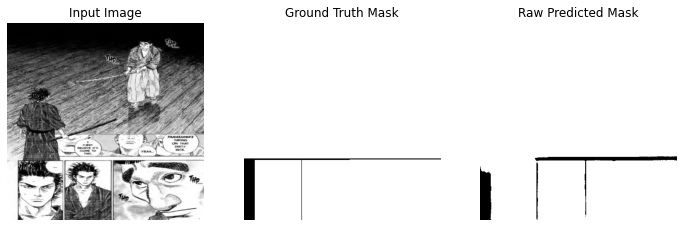

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 49 - Pixel Accuracy: 0.9752 - Precision: 1.0000 - Recall: 0.9728 - F1 Score: 0.9862


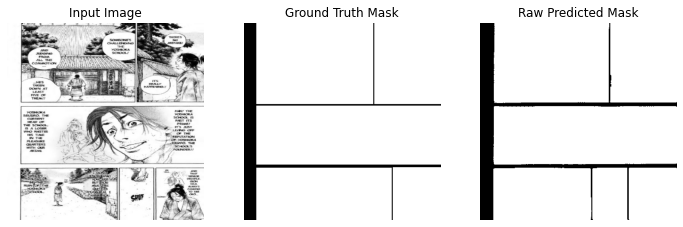

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 50 - Pixel Accuracy: 0.9796 - Precision: 0.9914 - Recall: 0.9857 - F1 Score: 0.9885


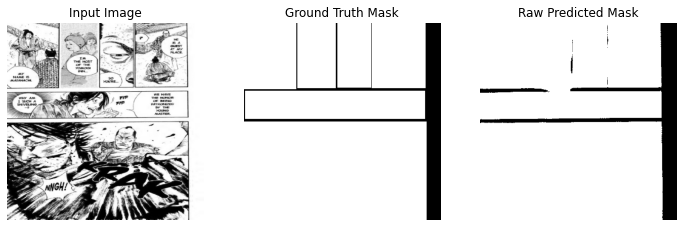

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 51 - Pixel Accuracy: 0.9829 - Precision: 0.9997 - Recall: 0.9815 - F1 Score: 0.9905


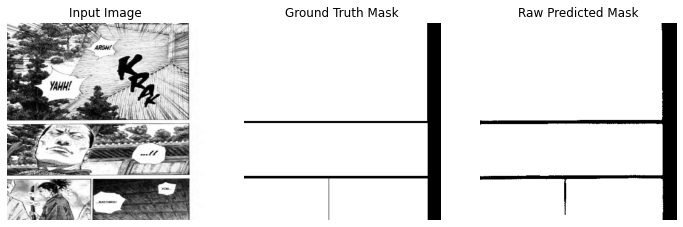

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 52 - Pixel Accuracy: 0.9819 - Precision: 0.9914 - Recall: 0.9883 - F1 Score: 0.9899


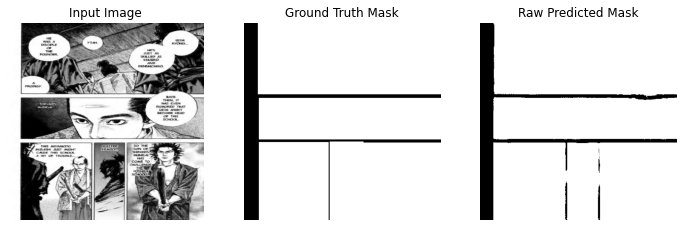

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 53 - Pixel Accuracy: 0.9960 - Precision: 0.9975 - Recall: 0.9981 - F1 Score: 0.9978


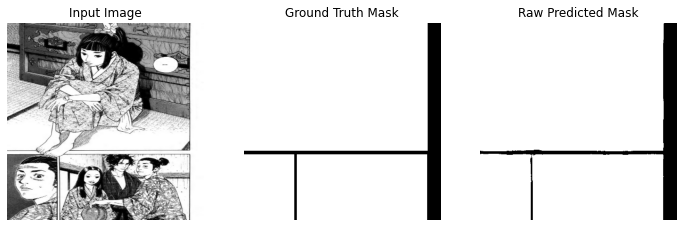

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 54 - Pixel Accuracy: 0.9887 - Precision: 1.0000 - Recall: 0.9887 - F1 Score: 0.9943


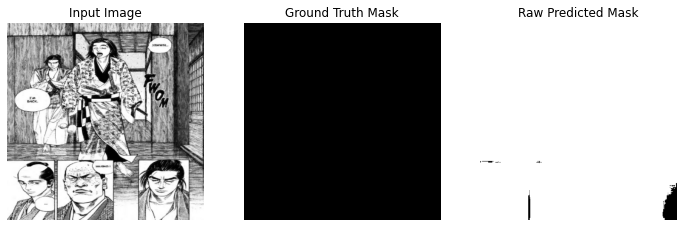

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Sample 55 - Pixel Accuracy: 0.9732 - Precision: 0.9816 - Recall: 0.9881 - F1 Score: 0.9849


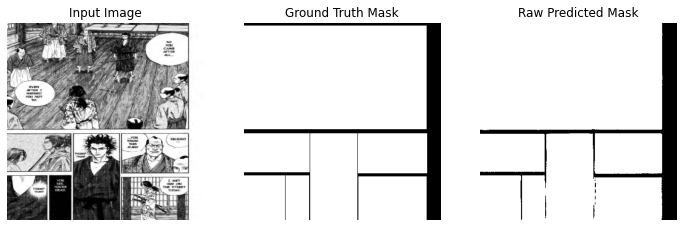

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Sample 56 - Pixel Accuracy: 0.9710 - Precision: 1.0000 - Recall: 0.9688 - F1 Score: 0.9841


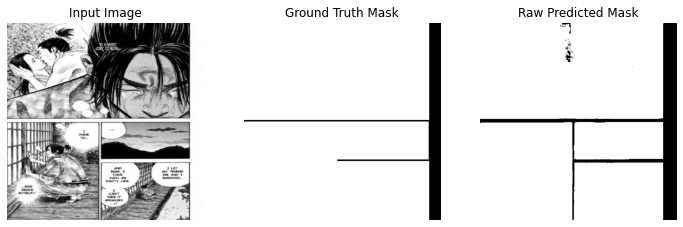

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 57 - Pixel Accuracy: 1.0000 - Precision: 1.0000 - Recall: 1.0000 - F1 Score: 1.0000


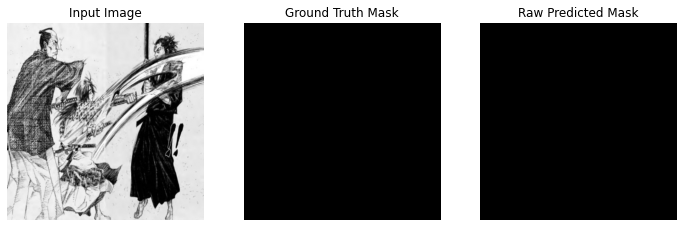

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 58 - Pixel Accuracy: 0.9880 - Precision: 0.9944 - Recall: 0.9924 - F1 Score: 0.9934


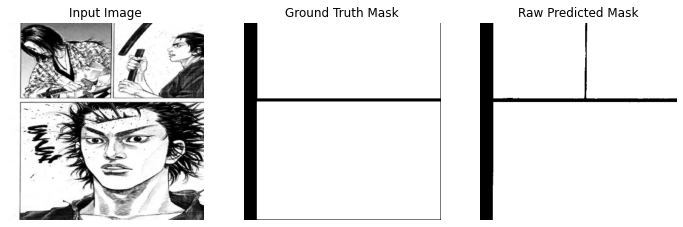

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 59 - Pixel Accuracy: 0.9960 - Precision: 0.9960 - Recall: 0.9996 - F1 Score: 0.9978


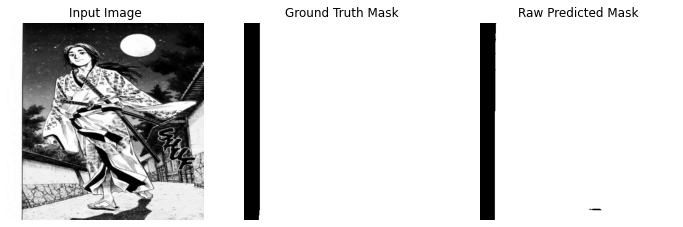

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 60 - Pixel Accuracy: 0.9832 - Precision: 0.9999 - Recall: 0.9821 - F1 Score: 0.9909


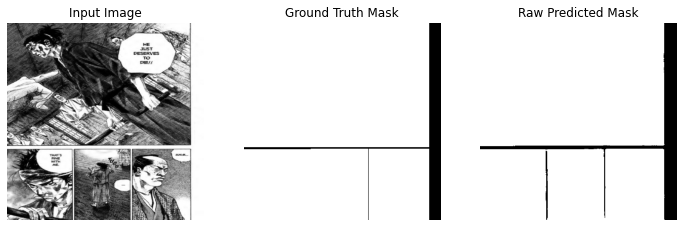

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 61 - Pixel Accuracy: 0.9860 - Precision: 0.9909 - Recall: 0.9932 - F1 Score: 0.9921


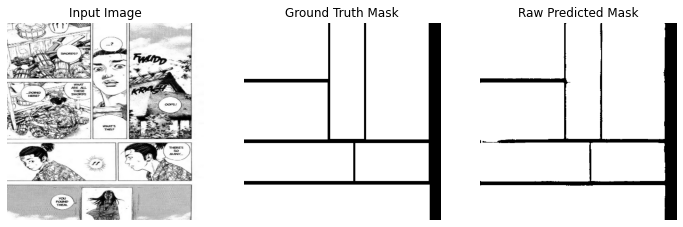

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 62 - Pixel Accuracy: 0.9898 - Precision: 0.9909 - Recall: 0.9978 - F1 Score: 0.9943


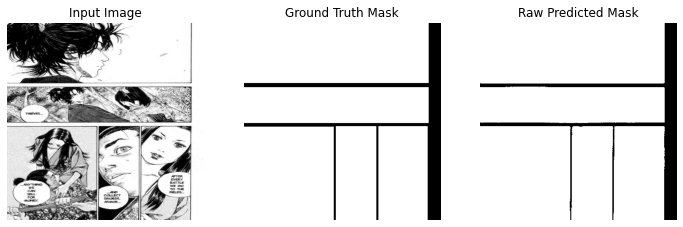

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 63 - Pixel Accuracy: 1.0000 - Precision: 1.0000 - Recall: 1.0000 - F1 Score: 1.0000


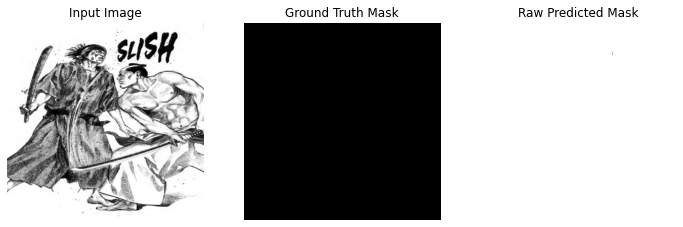

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 64 - Pixel Accuracy: 0.9952 - Precision: 0.9993 - Recall: 0.9958 - F1 Score: 0.9976


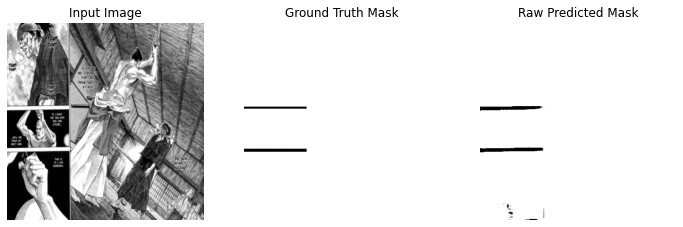

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 65 - Pixel Accuracy: 0.9947 - Precision: 0.9993 - Recall: 0.9951 - F1 Score: 0.9972


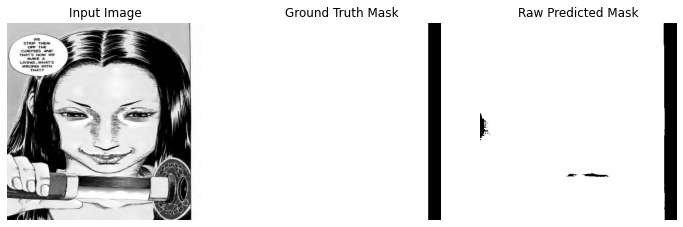

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 66 - Pixel Accuracy: 0.9876 - Precision: 0.9997 - Recall: 0.9865 - F1 Score: 0.9930


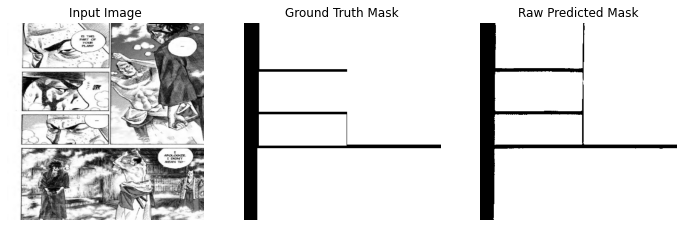

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 67 - Pixel Accuracy: 0.9967 - Precision: 0.9971 - Recall: 0.9993 - F1 Score: 0.9982


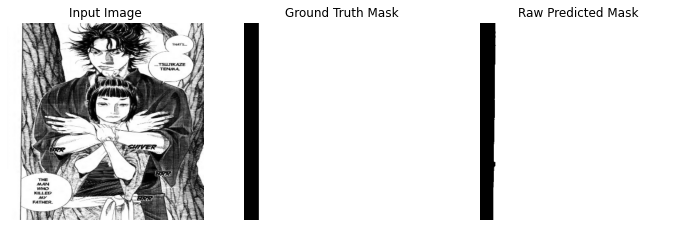

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 68 - Pixel Accuracy: 0.9902 - Precision: 0.9943 - Recall: 0.9946 - F1 Score: 0.9945


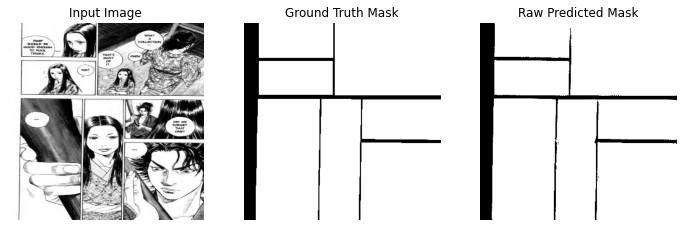

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 69 - Pixel Accuracy: 0.9913 - Precision: 0.9935 - Recall: 0.9969 - F1 Score: 0.9952


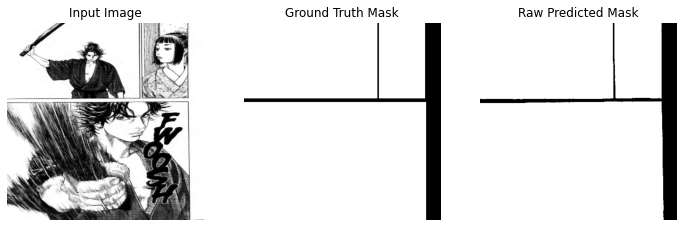

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 70 - Pixel Accuracy: 0.9878 - Precision: 0.9902 - Recall: 0.9961 - F1 Score: 0.9932


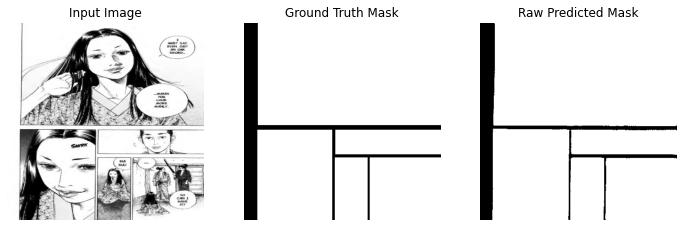

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 71 - Pixel Accuracy: 0.9869 - Precision: 0.9872 - Recall: 0.9983 - F1 Score: 0.9927


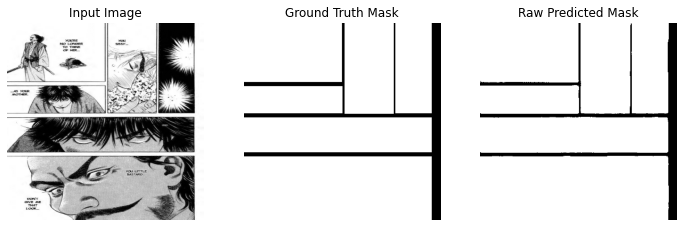

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Sample 72 - Pixel Accuracy: 0.9929 - Precision: 0.9973 - Recall: 0.9950 - F1 Score: 0.9961


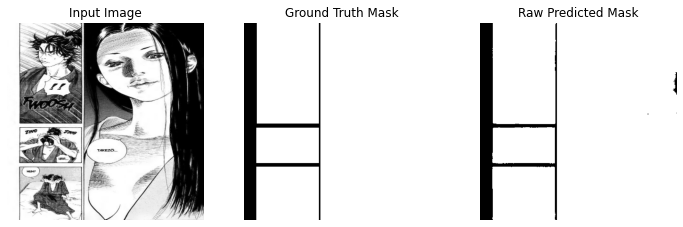

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 73 - Pixel Accuracy: 0.9922 - Precision: 0.9966 - Recall: 0.9949 - F1 Score: 0.9958


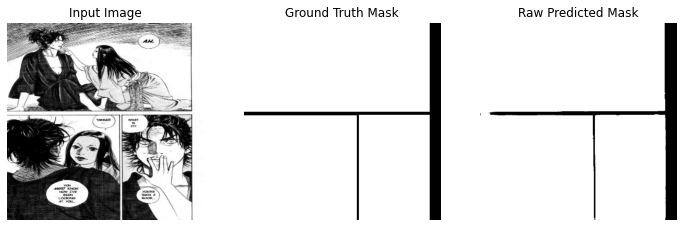

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Sample 74 - Pixel Accuracy: 0.9985 - Precision: 0.9994 - Recall: 0.9990 - F1 Score: 0.9992


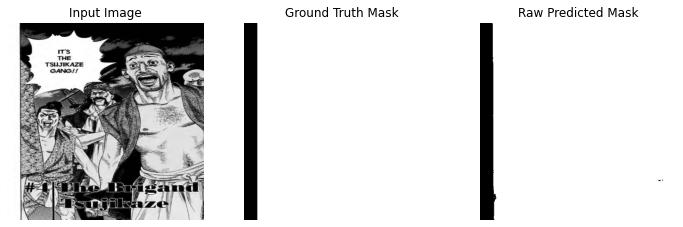

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Sample 75 - Pixel Accuracy: 0.9911 - Precision: 0.9975 - Recall: 0.9925 - F1 Score: 0.9950


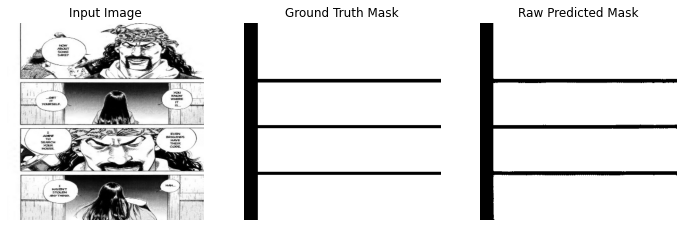

Average Pixel Accuracy: 0.9891
Average Precision: 0.9944
Average Recall: 0.9936
Average F1 Score: 0.9940


In [13]:
test_images, test_masks = load_images_and_masks('Panel-extraction-2/test')

pixel_accuracies = []
pixel_precisions = []
pixel_recalls = []
pixel_f1s = []

for i in range(len(test_images)): 
    img = test_images[i]
    true_mask = test_masks[i]

    pred_mask = model_250.predict(img[np.newaxis, ...])[0]

    metrics = calculate_metrics(pred_mask, true_mask)
    pixel_accuracies.append(metrics['pixel_accuracy'])
    pixel_precisions.append(metrics['precision'])
    pixel_recalls.append(metrics['recall'])
    pixel_f1s.append(metrics['f1_score'])
    
    print(f"Sample {i+1} - Pixel Accuracy: {metrics['pixel_accuracy']:.4f} - Precision: {metrics['precision']:.4f} - Recall: {metrics['recall']:.4f} - F1 Score: {metrics['f1_score']:.4f}")
    plot_predictions_no_post_processing(img, true_mask, pred_mask)

print(f"Average Pixel Accuracy: {np.mean(pixel_accuracies):.4f}")
print(f"Average Precision: {np.mean(pixel_precisions):.4f}")
print(f"Average Recall: {np.mean(pixel_recalls):.4f}")
print(f"Average F1 Score: {np.mean(pixel_f1s):.4f}")

In [15]:
def save_preds(test_images, test_masks, model, save_folder='best_model_resunet_aug_pred'):
    os.makedirs(save_folder, exist_ok=True)
    img_folder = os.path.join(save_folder, 'img')
    true_mask_folder = os.path.join(save_folder, 'true_mask')
    pred_mask_folder = os.path.join(save_folder, 'pred_mask_raw')
    os.makedirs(img_folder, exist_ok=True)
    os.makedirs(true_mask_folder, exist_ok=True)
    os.makedirs(pred_mask_folder, exist_ok=True)

    for i in range(len(test_images)):
        img = test_images[i]
        true_mask = test_masks[i]

        pred_mask = model.predict(img[np.newaxis, ...])[0] 

        img_path = os.path.join(img_folder, f"img_{i+1}.png")
        true_mask_path = os.path.join(true_mask_folder, f"true_mask_{i+1}.png")
        pred_mask_path = os.path.join(pred_mask_folder, f"pred_mask_raw_{i+1}.png")

        img_to_save = (img * 255).astype(np.uint8)  

        true_mask_to_save = ((true_mask > 0.5) * 255).astype(np.uint8)  
        pred_mask_to_save = ((pred_mask > 0.5) * 255).astype(np.uint8)  

        cv2.imwrite(img_path, img_to_save)
        cv2.imwrite(true_mask_path, true_mask_to_save)
        cv2.imwrite(pred_mask_path, pred_mask_to_save)
        
    print('Done')
        
save_preds(test_images, test_masks, model_250)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━

In [19]:
folder_to_zip = 'best_resunet_pred'
zip_file_path = 'best_resunet_pred.zip'
shitul.make_archive(folder_to_zip, 'zip', folder_to_zip)

'/mnt/Data/Long-Data/group project/best_resunet_pred.zip'

----

## Train lên thg ebdtheque (deprecated)

In [28]:
base_dir = "eBDtheque_database_v3"
pages_dir = os.path.join(base_dir, "Pages")
gt_dir = os.path.join(base_dir, "GT")
combined_dir = os.path.join(base_dir, "combined_data")
train_dir = os.path.join(base_dir, "train")
test_dir = os.path.join(base_dir, "test")

os.makedirs(combined_dir, exist_ok=True)
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

image_files = sorted([f for f in os.listdir(pages_dir) if f.endswith('.jpg')])
annotation_files = sorted([f.replace('.jpg', '.svg') for f in image_files])
data_pairs = list(zip(image_files, annotation_files))

for image_file, annotation_file in data_pairs:
    shutil.copy(os.path.join(pages_dir, image_file), os.path.join(combined_dir, image_file))
    shutil.copy(os.path.join(gt_dir, annotation_file), os.path.join(combined_dir, annotation_file))

random.shuffle(data_pairs)
train_pairs = data_pairs[:70]
test_pairs = data_pairs[70:]

for image_file, annotation_file in train_pairs:
    shutil.copy(os.path.join(combined_dir, image_file), train_dir)
    shutil.copy(os.path.join(combined_dir, annotation_file), train_dir)

for image_file, annotation_file in test_pairs:
    shutil.copy(os.path.join(combined_dir, image_file), test_dir)
    shutil.copy(os.path.join(combined_dir, annotation_file), test_dir)

print("Data successfully combined and split into train and test folders.")

NameError: name 'shutil' is not defined

### Phần trên này không chạy lại

In [35]:
def parse_svg_to_mask(svg_path, image_shape):
    png_data = cairosvg.svg2png(url=svg_path, output_width=image_shape[1], output_height=image_shape[0])

    image = Image.open(io.BytesIO(png_data)).convert("L")
    mask = np.array(image)
    binary_mask = (mask > 0).astype(np.uint8) 

    return binary_mask

In [36]:
def load_images_and_masks_svg(folder_path, image_size=(384, 384)):
    images = []
    masks = []
    
    jpg_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.jpg')])

    for jpg_file in jpg_files:
        img_path = os.path.join(folder_path, jpg_file)
        img = cv2.imread(img_path)
        #img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        if img is None:
            print(f"Warning: Image file {jpg_file} could not be loaded.")
            continue
        #gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        #img = cv2.merge([gray_img, gray_img, gray_img])
        
        svg_file = jpg_file.replace('.jpg', '.svg')
        svg_path = os.path.join(folder_path, svg_file)
        
        if os.path.exists(svg_path):
            mask = parse_svg_to_mask(svg_path, img.shape) 
            
            img_resized = cv2.resize(img, image_size)
            mask_resized = cv2.resize(mask, image_size, interpolation=cv2.INTER_NEAREST)
            
            img_resized = img_resized / 255.0
            mask_resized = (mask_resized > 0.5).astype(np.uint8)
            
            images.append(img_resized)
            masks.append(mask_resized[..., np.newaxis]) 
        else:
            print(f"Warning: No .svg file found for {jpg_file}")
    
    return np.array(images), np.array(masks)


In [37]:
skibidi_model = tf.keras.models.load_model('models/best_model_3.keras')

In [23]:
train_images, train_masks = load_images_and_masks_svg('eBDtheque_database_v3/train_set')

decay_steps = 1500
initial_learning_rate = 0.0
warmup_steps = 200
target_learning_rate = 0.001
lr_schedule = keras.optimizers.schedules.CosineDecay(
    initial_learning_rate, decay_steps, warmup_target=target_learning_rate,
    warmup_steps=warmup_steps
)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

skibidi_model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

tensorboard_callback = TensorBoard(log_dir="./logs", histogram_freq=1)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=0.00005)

In [24]:
history = skibidi_model.fit(
    train_images, train_masks,
    batch_size=8,
    epochs=75,
    callbacks=[reduce_lr, tensorboard_callback],
    verbose = 1
)

skibidi_model.save('models/ebdtheque_trained_2.keras')

Epoch 1/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 927ms/step - accuracy: 0.7920 - loss: 1.3645 - learning_rate: 5.0000e-05
Epoch 2/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 608ms/step - accuracy: 0.8052 - loss: 1.1736 - learning_rate: 1.0000e-04
Epoch 3/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 613ms/step - accuracy: 0.8186 - loss: 0.8769 - learning_rate: 1.5000e-04
Epoch 4/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 617ms/step - accuracy: 0.8225 - loss: 0.6373 - learning_rate: 2.0000e-04
Epoch 5/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 608ms/step - accuracy: 0.8477 - loss: 0.3731 - learning_rate: 2.5000e-04
Epoch 6/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 611ms/step - accuracy: 0.8872 - loss: 0.2734 - learning_rate: 3.0000e-04
Epoch 7/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 610ms/step - accuracy: 0.9085 - loss: 0.2319 - learning_rate: 3.5000e-04
Epoch 8/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 605ms/step - accuracy: 0.9274 - loss: 0.1923 - learning_rate: 4.0000e-04
Epoch 9/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 614ms/step - accuracy: 0.9292 - loss: 0.1828 -

10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 625ms/step - accuracy: 0.9954 - loss: 0.0119 - learning_rate: 8.5724e-04
Epoch 58/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 619ms/step - accuracy: 0.9953 - loss: 0.0125 - learning_rate: 8.4983e-04
Epoch 59/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 615ms/step - accuracy: 0.9960 - loss: 0.0108 - learning_rate: 8.4227e-04
Epoch 60/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 623ms/step - accuracy: 0.9961 - loss: 0.0104 - learning_rate: 8.3457e-04
Epoch 61/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 622ms/step - accuracy: 0.9966 - loss: 0.0090 - learning_rate: 8.2671e-04
Epoch 62/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 620ms/step - accuracy: 0.9965 - loss: 0.0093 - learning_rate: 8.1871e-04
Epoch 63/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 632ms/step - accuracy: 0.9970 - loss: 0.0080 - learning_rate: 8.1057e-04
Epoch 64/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 619ms/step - accuracy: 0.9972 - loss: 0.0075 - learning_rate: 8.0230e-04
Epoch 65/75
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 621ms/step - accuracy: 0.9974 - loss: 0.0070 - lea

In [17]:
skibidi_model = tf.keras.models.load_model('models/ebdtheque_trained_2.keras')

NameError: name 'tf' is not defined

In [39]:
def plotting(image, true_mask, threshold=0.5):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    plt.imshow(image, cmap = 'gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(true_mask.squeeze(), cmap='gray')
    plt.axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step
Sample 1 - Pixel Accuracy: 0.7804 - Precision: 0.7562 - Recall: 0.9889 - F1 Score: 0.8570


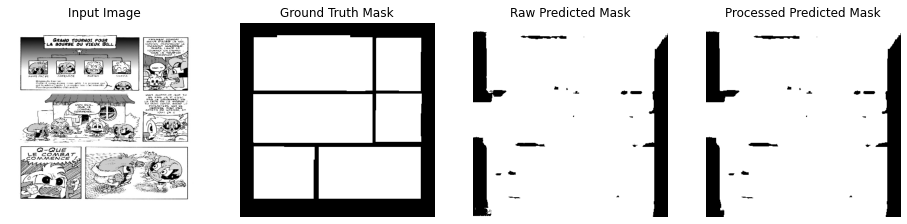

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Sample 2 - Pixel Accuracy: 0.7741 - Precision: 0.7542 - Recall: 0.9849 - F1 Score: 0.8543


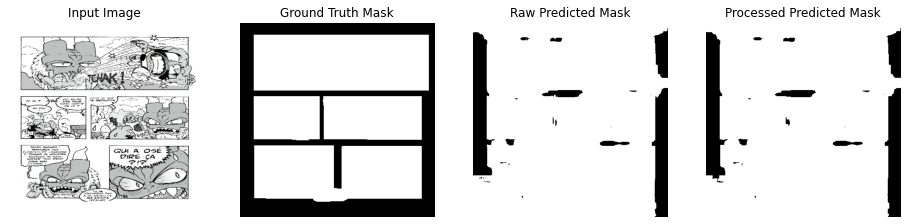

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Sample 3 - Pixel Accuracy: 0.7925 - Precision: 0.7992 - Recall: 0.9830 - F1 Score: 0.8816


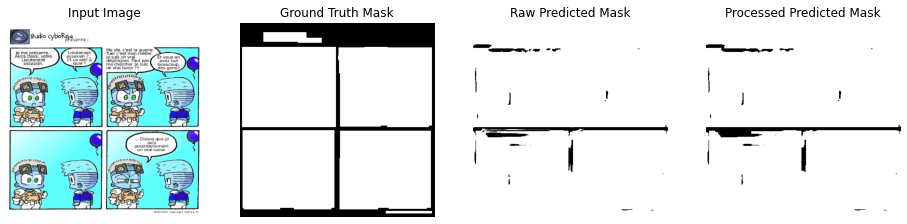

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Sample 4 - Pixel Accuracy: 0.4272 - Precision: 0.4165 - Recall: 0.9951 - F1 Score: 0.5872


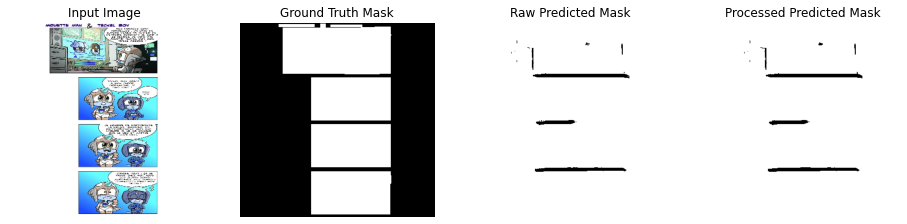

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 5 - Pixel Accuracy: 0.8259 - Precision: 0.7968 - Recall: 0.9870 - F1 Score: 0.8818


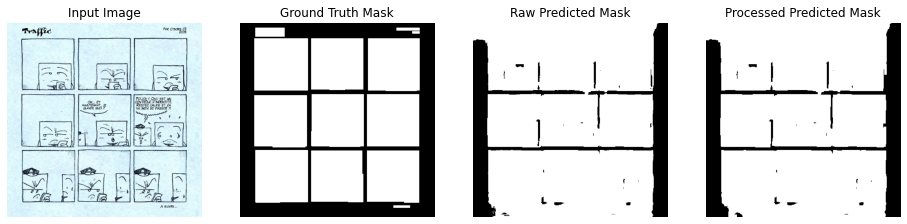

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Sample 6 - Pixel Accuracy: 0.8425 - Precision: 0.8431 - Recall: 0.9992 - F1 Score: 0.9145


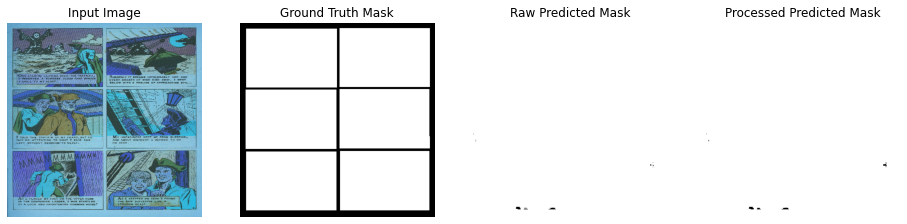

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 7 - Pixel Accuracy: 0.8125 - Precision: 0.7999 - Recall: 0.9976 - F1 Score: 0.8879


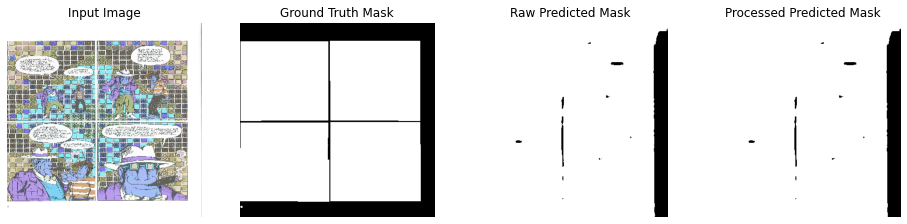

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 8 - Pixel Accuracy: 0.7838 - Precision: 0.7760 - Recall: 0.9965 - F1 Score: 0.8725


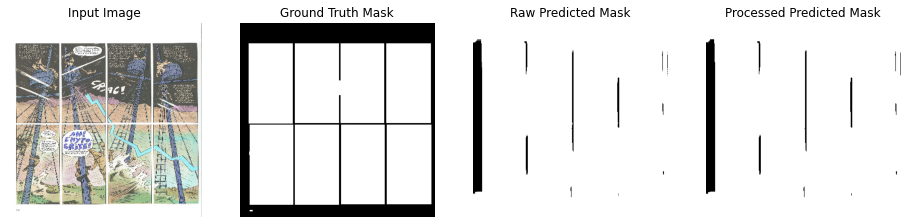

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 9 - Pixel Accuracy: 0.8637 - Precision: 0.8761 - Recall: 0.9822 - F1 Score: 0.9261


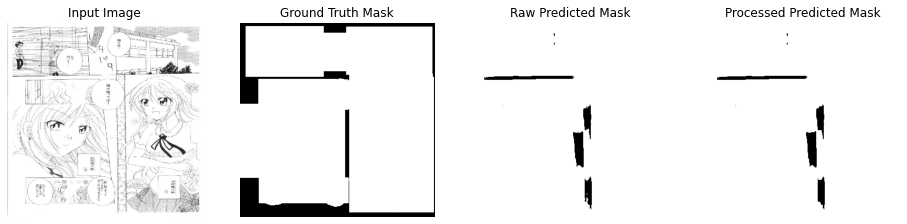

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Sample 10 - Pixel Accuracy: 0.8627 - Precision: 0.8598 - Recall: 0.9970 - F1 Score: 0.9233


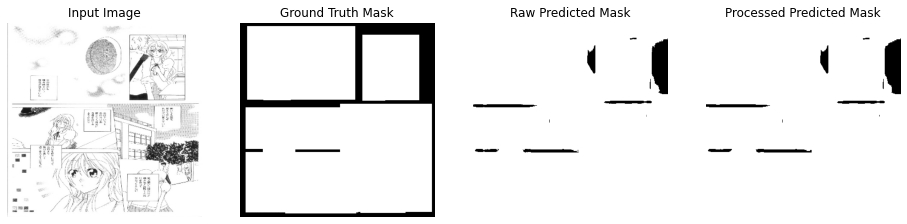

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 11 - Pixel Accuracy: 0.8534 - Precision: 0.8420 - Recall: 0.9984 - F1 Score: 0.9136


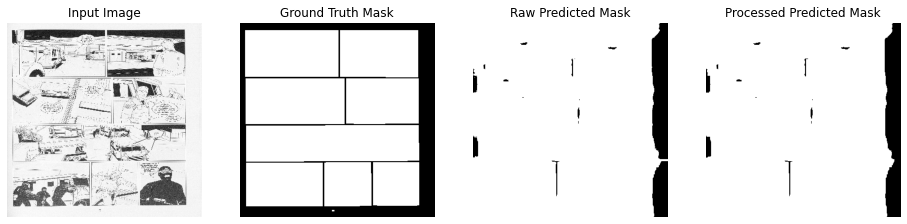

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 12 - Pixel Accuracy: 0.8099 - Precision: 0.8232 - Recall: 0.9777 - F1 Score: 0.8938


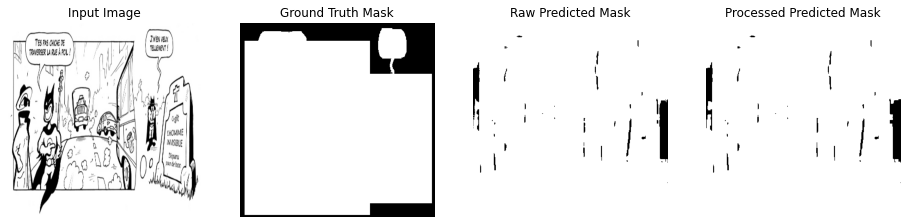

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 13 - Pixel Accuracy: 0.8179 - Precision: 0.7884 - Recall: 0.9902 - F1 Score: 0.8779


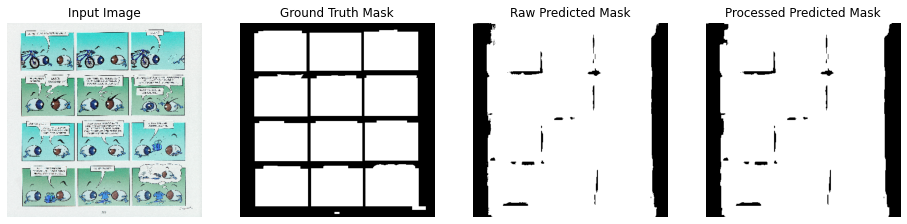

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 14 - Pixel Accuracy: 0.8590 - Precision: 0.8582 - Recall: 0.9978 - F1 Score: 0.9228


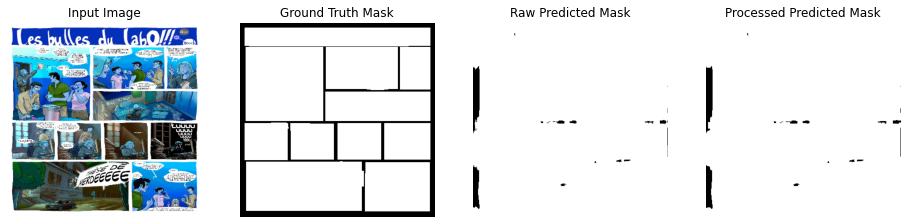

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 15 - Pixel Accuracy: 0.8662 - Precision: 0.8688 - Recall: 0.9932 - F1 Score: 0.9268


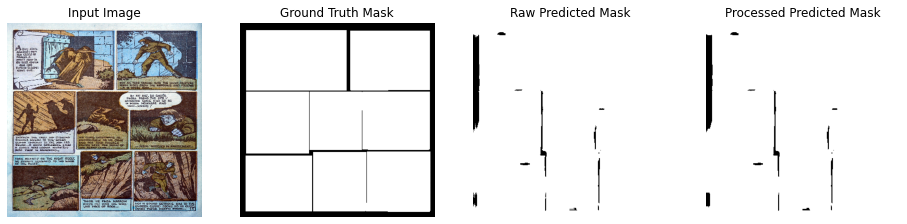

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Sample 16 - Pixel Accuracy: 0.8517 - Precision: 0.8517 - Recall: 0.9996 - F1 Score: 0.9197


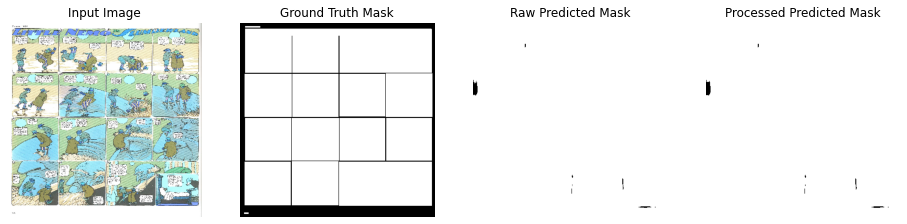

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Sample 17 - Pixel Accuracy: 0.7580 - Precision: 0.7573 - Recall: 0.9968 - F1 Score: 0.8607


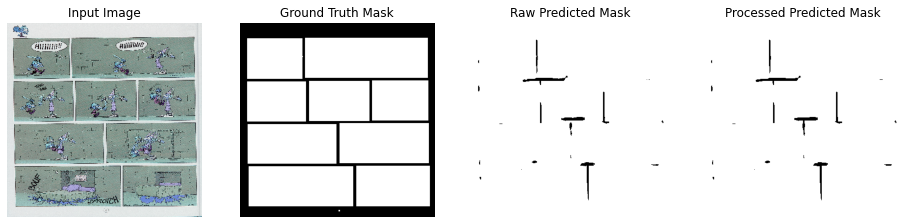

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Sample 18 - Pixel Accuracy: 0.7492 - Precision: 0.7385 - Recall: 0.9991 - F1 Score: 0.8492


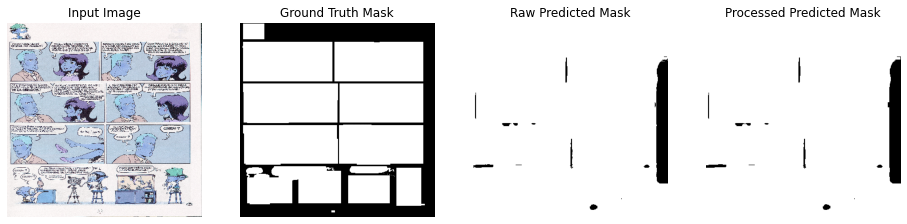

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 19 - Pixel Accuracy: 0.5034 - Precision: 0.5037 - Recall: 0.9987 - F1 Score: 0.6696


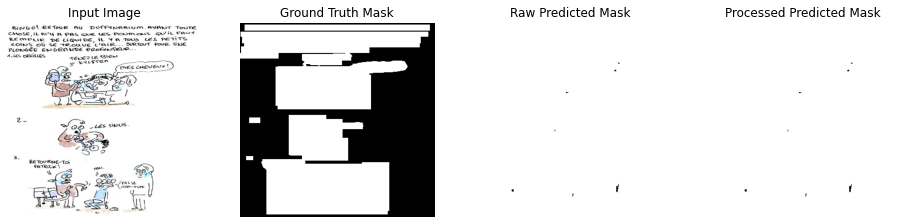

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 20 - Pixel Accuracy: 0.8513 - Precision: 0.8508 - Recall: 0.9979 - F1 Score: 0.9185


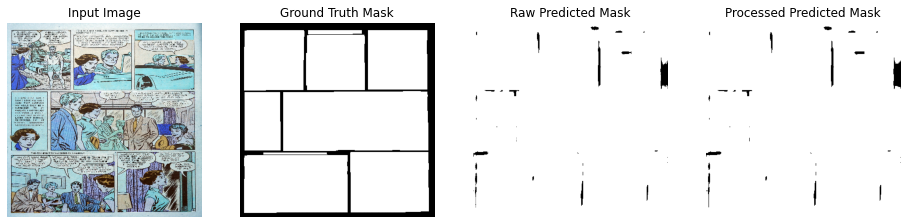

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 21 - Pixel Accuracy: 0.9696 - Precision: 0.9714 - Recall: 0.9980 - F1 Score: 0.9846


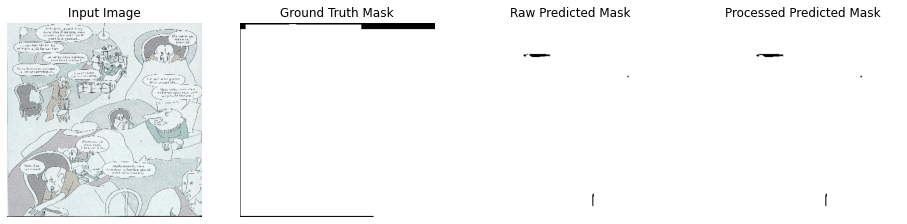

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 22 - Pixel Accuracy: 0.7350 - Precision: 0.7253 - Recall: 0.9934 - F1 Score: 0.8385


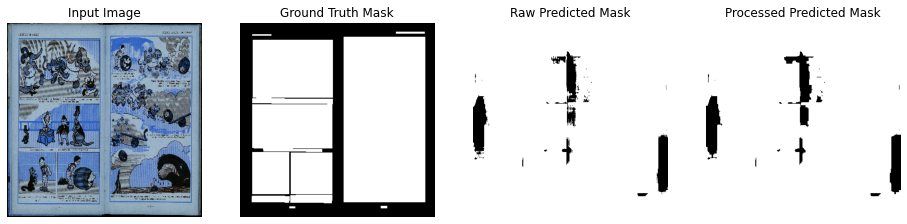

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 23 - Pixel Accuracy: 0.7724 - Precision: 0.7610 - Recall: 0.9993 - F1 Score: 0.8640


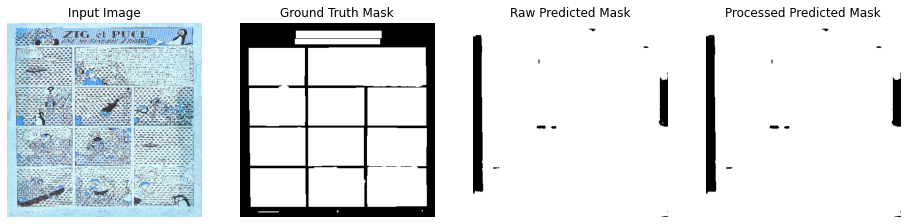

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Sample 24 - Pixel Accuracy: 0.8489 - Precision: 0.8394 - Recall: 0.9970 - F1 Score: 0.9114


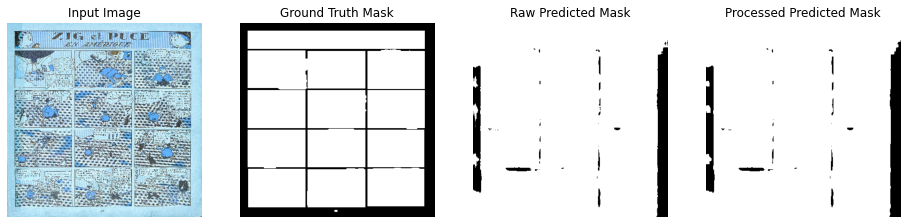

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Sample 25 - Pixel Accuracy: 0.9223 - Precision: 0.9223 - Recall: 1.0000 - F1 Score: 0.9596


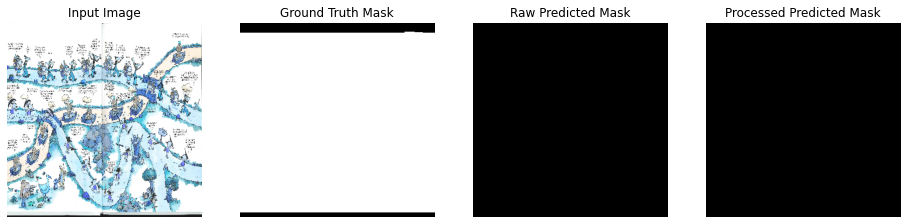

Average Pixel Accuracy: 0.7973
Average Precision: 0.7912
Average Recall: 0.9939
Average F1 Score: 0.8759


In [42]:
test_images, test_masks = load_images_and_masks_svg('eBDtheque_database_v3/test_set')

pixel_accuracies = []
pixel_precisions = []
pixel_recalls = []
pixel_f1s = []

for i in range(len(test_images)): 
    img = test_images[i]
    true_mask = test_masks[i]

    pred_mask = skibidi_model.predict(img[np.newaxis, ...])[0]
    processed_mask = post_process_mask(pred_mask)

    metrics = calculate_metrics(pred_mask, true_mask)
    pixel_accuracies.append(metrics['pixel_accuracy'])
    pixel_precisions.append(metrics['precision'])
    pixel_recalls.append(metrics['recall'])
    pixel_f1s.append(metrics['f1_score'])
    
    print(f"Sample {i+1} - Pixel Accuracy: {metrics['pixel_accuracy']:.4f} - Precision: {metrics['precision']:.4f} - Recall: {metrics['recall']:.4f} - F1 Score: {metrics['f1_score']:.4f}")
    plot_predictions_post_processing(img, true_mask, pred_mask, processed_mask)

print(f"Average Pixel Accuracy: {np.mean(pixel_accuracies):.4f}")
print(f"Average Precision: {np.mean(pixel_precisions):.4f}")
print(f"Average Recall: {np.mean(pixel_recalls):.4f}")
print(f"Average F1 Score: {np.mean(pixel_f1s):.4f}")

In [ ]:
for i in range(len(test_images)): 
    img = test_images[i]
    true_mask = test_masks[i]
    pred_mask = skibidi_model.predict(img[np.newaxis, ...])[0]
    pred_mask_gaussian = kuwahara(pred_mask, method='gaussian', radius=3)
    metrics = calculate_metrics(pred_mask_smoothed, true_mask)
    pixel_accuracies.append(metrics['pixel_accuracy'])
    pixel_precisions.append(metrics['precision'])
    pixel_recalls.append(metrics['recall'])
    pixel_f1s.append(metrics['f1_score'])
    print(f"Sample {i+1} - Pixel Accuracy: {metrics['pixel_accuracy']:.4f} - Precision: {metrics['precision']:.4f} - Recall: {metrics['recall']:.4f} - F1 Score: {metrics['f1_score']:.4f}")
    plot_predictions_post_processing(img, true_mask, pred_mask, pred_mask_gaussian, threshold=0.5)
    break

----